**Group information**

| Family name | First name | Email address |
| ----------- | ---------- | ------------- |
| ZGUIOUAR    | Charaf     |zgcharaf@gmail.com              |
|             |            |               |
|             |            |               |

# Semantic segmentation - Practice

This tutorial explores how to extract automatically building footprints from aerial images. We want to approximate the function mapping input images to a binary prediction for each pixel (i.e. semantic segmentation) using the U-Net convolutional network architecture [(Ronneberger et al. 2015)](https://link.springer.com/chapter/10.1007/978-3-319-24574-4_28). For this assignment, the GPU implementation of TensorFlow is recommended.

The image data consists of 3347 colour raster of dimension 256x256x3 using the NAD83 (EPSG:26986) projection system. Each raster represents an area of 300 square meters in the state of Massachusetts. The label data consists of building footprints vectors extracted from [OpenStreetMap](https://www.openstreetmap.org/relation/61315) and converted into a binary raster with the same extent and resolution as the image rasters. The unformatted data was provided by Minh (2013) and can be accessed on his [website](http://www.cs.toronto.edu/~vmnih/data/). Images and labels are randomly partitioned into a training (70%) validation (15%) and test sample (15%).

Tensorflow Keras documentation:
- [Convolution](https://keras.io/api/layers/convolution_layers/)
- [Activation](https://keras.io/api/layers/activations/)
- [Pooling](https://keras.io/api/layers/pooling_layers/)
- [Regularisation](https://keras.io/api/layers/regularization_layers/)
- [Optimisers](https://keras.io/api/optimizers/)
- [Metrics](https://keras.io/api/metrics/)
- [Losses](https://keras.io/api/losses/)
- [Callbacks](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks)

![U-Net model](https://www.dropbox.com/scl/fi/wgvqiix6scbm1c983ephk/segmentation_model.jpg?rlkey=71blfq7cm1yzw26puu4l0ybhs&dl=1)

In [73]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
'''
@description: Utilities for the aerial image segmentation homework
'''

#%% MODULES

import numpy as np
import os
import rasterio
import re

from matplotlib import pyplot

#%% FILE UTILITIES

def search_files(directory:str, pattern:str='.') -> list:
    '''Searches files in a directory'''
    files = list()
    for root, _, file_names in os.walk(directory):
        for file_name in file_names:
            files.append(os.path.join(root, file_name))
    files = list(filter(re.compile(pattern).search, files))
    files.sort()
    return files

#%% RASTER UTILITIES

def read_raster(source:str, dtype:type=np.uint8) -> np.ndarray:
    '''Reads a raster as a numpy array'''
    raster = rasterio.open(source)
    raster = raster.read()
    image  = raster.transpose([1, 2, 0]).astype(dtype)
    return image

def write_raster(image:np.ndarray, source:str, destination:str, nodata:int=0, dtype:str='uint8') -> None:
    '''Writes a numpy array as a raster'''
    raster  = image.transpose([2, 0, 1]).astype(dtype)
    profile = rasterio.open(source).profile
    profile.update(dtype=dtype, count=raster.shape[0], nodata=nodata)
    with rasterio.open(destination, 'w', **profile) as dest:
        dest.write(raster)

#%% DISPLAY UTILITIES

def display(image:np.ndarray, title:str='') -> None:
    '''Displays an image'''
    fig, ax = pyplot.subplots(1, figsize=(5, 5))
    ax.imshow(image, cmap='gray')
    ax.set_title(title, fontsize=20)
    ax.set_axis_off()
    pyplot.tight_layout()
    pyplot.show()

def compare(images:list, titles:list=['']) -> None:
    '''Displays multiple images'''
    nimage = len(images)
    if len(titles) == 1:
        titles = titles * nimage
    fig, axs = pyplot.subplots(nrows=1, ncols=nimage, figsize=(5, 5*nimage))
    for ax, image, title in zip(axs.ravel(), images, titles):
        ax.imshow(image, cmap='gray')
        ax.set_title(title, fontsize=15)
        ax.set_axis_off()
    pyplot.tight_layout()
    pyplot.show()

def display_history(history:dict, metrics:list=['accuracy', 'loss']) -> None:
    '''Displays training history'''
    fig, axs = pyplot.subplots(nrows=1, ncols=2, figsize=(10, 5))
    for ax, metric in zip(axs.ravel(), metrics):
        ax.plot(history[metric])
        ax.plot(history[f'val_{metric}'])
        ax.set_title(f'Training {metric}', fontsize=15)
        ax.set_ylabel('Accuracy')
        ax.set_xlabel('Epoch')
        ax.legend(['Training sample', 'Validation sample'], frameon=False)
    pyplot.tight_layout()
    pyplot.show()

def display_statistics(image_test:np.ndarray, label_test:np.ndarray, proba_predict:np.ndarray, label_predict:np.ndarray) -> None:
    '''Displays predictions statistics'''
    # Format arrays
    image_test    = (image_test * 255).astype(int)
    label_test    = label_test.astype(bool)
    label_predict = label_predict.astype(bool)
    # Computes statistics
    mask_tp = np.logical_and(label_test, label_predict)
    mask_tn = np.logical_and(np.invert(label_test), np.invert(label_predict))
    mask_fp = np.logical_and(np.invert(label_test), label_predict)
    mask_fn = np.logical_and(label_test, np.invert(label_predict))
    # Augments images
    colour  = (255, 255, 0)
    images  = [np.where(np.tile(mask, (1, 1, 3)), colour, image_test) for mask in [mask_tp, mask_tn, mask_fp, mask_fn]]
    # Figure
    images = [image_test, label_test, proba_predict, label_predict] + images
    titles = ['Test image', 'Test label', 'Predicted probability', 'Predicted label', 'True positive', 'True negative', 'False positive', 'False negative']
    fig, axs = pyplot.subplots(2, 4, figsize=(20, 10))
    for image, title, ax in zip(images, titles, axs.ravel()):
        ax.imshow(image)
        ax.set_title(title, fontsize=20)
        ax.axis('off')
    pyplot.tight_layout()
    pyplot.show()
    
import matplotlib.pyplot as plt
import numpy as np

def show_predictions(test_images, true_labels, predicted_labels, num_samples=5):
    plt.figure(figsize=(15, 5 * num_samples))

    indices = np.random.choice(range(len(test_images)), num_samples, replace=False)

    for idx, i in enumerate(indices):
        # Display the original image
        plt.subplot(num_samples, 3, idx * 3 + 1)
        plt.imshow(test_images[i])
        plt.title("Original Image")
        plt.axis('off')

        # Display true mask
        plt.subplot(num_samples, 3, idx * 3 + 2)
        plt.imshow(true_labels[i].squeeze(), cmap='gray')
        plt.title("True Mask")
        plt.axis('off')

        # Display predicted mask
        plt.subplot(num_samples, 3, idx * 3 + 3)
        plt.imshow(predicted_labels[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming predicted_labels are generated and have the same shape as test_labels:
# predicted_labels = (predicted_probabilities > 0.5).astype(int)  # Adjust the threshold as needed
# show_predictions(test_images, test_labels, predicted_labels)


In [5]:
# Packages
import numpy as np
import tensorflow
import os
import shutil
import tensorflow as tf
#from segmentation_utilities import *
from tensorflow.keras import callbacks, layers, losses, metrics, models, optimizers, preprocessing, utils
from urllib import request
# Working directory

# Checks tensorFlow
print('TensorFlow version:', tensorflow.__version__)
print('GPU available:', len(tensorflow.config.list_physical_devices('GPU')))

TensorFlow version: 2.15.0
GPU available: 2


In [7]:
# Utilities
def download_data() -> None:
    '''Downloads data folder'''
    request.urlretrieve('https://www.dropbox.com/scl/fo/s84ncdd29jokky00b5kwb/ABF1sS8NIhilM1N1-CF8w7Y?rlkey=si6j7dy9eg2mq0mwid2ytd53l&dl=1', 'data.zip')
    shutil.unpack_archive('data.zip', 'data')
    os.remove('data.zip')    
    os.chdir('data')

# Defines paths
paths = dict(
    images_train='training/images',
    labels_train='training/labels',
    images_valid='validation/images',
    labels_valid='validation/labels',
    images_test= 'test/images',
    labels_test= 'test/labels'
)

1. Load the images and labels for the training and validation samples as separate `numpy.ndarray` of dimensions $n \times h \times w \times d$. You can use the provided `search_files` and `read_raster` utility functions. Normalise the images between 0 and 1 and set the labels data type as float.

In [8]:
#Loads dataset
download_data() # On first execution

In [15]:
for dirname, _, filenames in os.walk('/kaggle/working'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/data/test/images/image_236786_907871.tif
/kaggle/working/data/test/images/image_233186_900671.tif
/kaggle/working/data/test/images/image_235286_891671.tif
/kaggle/working/data/test/images/image_243686_902171.tif
/kaggle/working/data/test/images/image_231686_891971.tif
/kaggle/working/data/test/images/image_227786_894671.tif
/kaggle/working/data/test/images/image_239186_903071.tif
/kaggle/working/data/test/images/image_236486_897071.tif
/kaggle/working/data/test/images/image_230186_886271.tif
/kaggle/working/data/test/images/image_229286_890471.tif
/kaggle/working/data/test/images/image_231686_904571.tif
/kaggle/working/data/test/images/image_230486_903971.tif
/kaggle/working/data/test/images/image_234686_894971.tif
/kaggle/working/data/test/images/image_235886_907871.tif
/kaggle/working/data/test/images/image_239786_903371.tif
/kaggle/working/data/test/images/image_237686_901571.tif
/kaggle/working/data/test/images/image_235886_897971.tif
/kaggle/working/data/test/image

In [28]:
validation = search_files('/kaggle/working/data/validation/images/', pattern='.')
training = search_files('/kaggle/working/data/training/images/', pattern='.')
testing =  search_files('/kaggle/working/data/test/images/', pattern='.')
train_labels, val_labels, test_labels = search_files('/kaggle/working/data/training/labels/', pattern='.'),search_files('/kaggle/working/data/validation/labels/', pattern='.'), search_files('/kaggle/working/data/test/labels/', pattern='.')

In [30]:
print('Training_shape:',len(training))
print('Train_labels_shape:',len(train_labels))
print('Testing_shape:',len(testing))
print('Test_labels_shape:',len(test_labels))
print('Validation_shape:',len(validation))
print('Validation_labels_shape:',len(val_labels))


Training_shape: 234
Train_labels_shape: 234
Testing_shape: 50
Test_labels_shape: 50
Validation_shape: 50
Validation_labels_shape: 50


In [31]:
import numpy as np

def from_list_to_array(images_set: list) -> np.ndarray:
    n = len(images_set)
    images = np.zeros((256, 256, 3, n))
    for i, image in enumerate(images_set):
        img_ = read_raster(image)   
        images[:, :, :, i] = img_
    return images


In [32]:
testing_arr, training_arr, val_arr = from_list_to_array(testing), from_list_to_array(training),from_list_to_array(validation)
testing_arr_lab, training_arr_lab, val_arr_lab = from_list_to_array(test_labels), from_list_to_array(train_labels),from_list_to_array(val_labels)

2. For the training and validation samples, check the dimensions of the images and labels arrays. Display several matching image and label pairs to ensure correspondence. You can use the provided `compare` utility function.

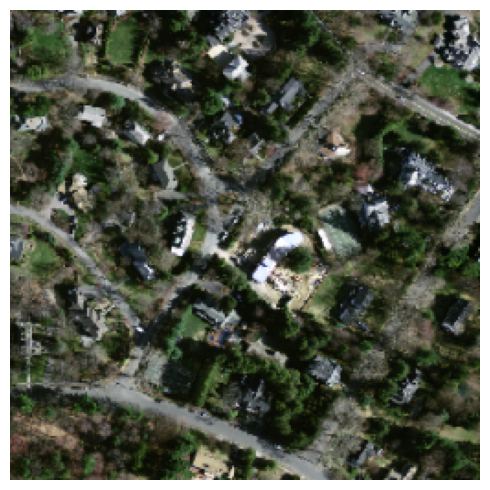

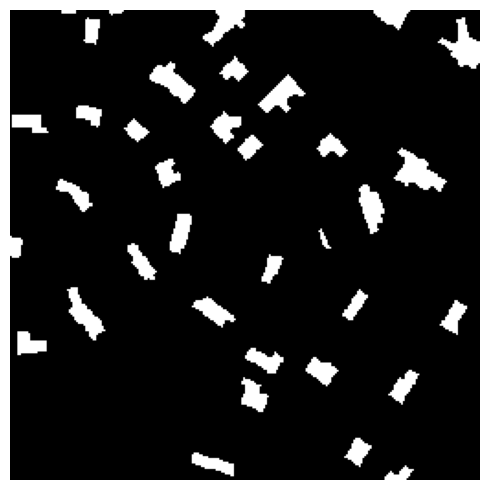

In [33]:
display(training_arr[:,:,:,10]/training_arr[:,:,:,4].max())
display(training_arr_lab[:,:,:,10])

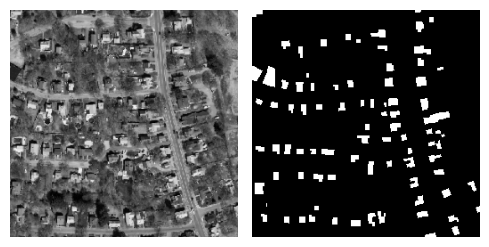

In [34]:
compare([testing_arr[:,:,0,-2],testing_arr_lab[:,:,:,-2] ])

3. Using the Keras functional API, define a simplified U-Net model with the number of kernels indicated in the figure above (i.e. 8, 16, 32, 64, 128, ...). There are numerous implementation examples of U-Nets using Keras. Choose the appropriate activation functions for the hidden layers and the output layer, and the corresponding parameter initialisation method.

   
U-Net is a type of convolutional neural network (CNN) architecture that was developed primarily for biomedical image segmentation. It was first introduced in a paper by Olaf Ronneberger, Philipp Fischer, and Thomas Brox titled "U-Net: Convolutional Networks for Biomedical Image Segmentation." The architecture is particularly well-suited for tasks where precise localization is crucial, such as in medical imaging where the boundaries of an area (like a tumor or other pathological regions) need to be clearly defined.

<img src='segmentation_model.jpg'>

In [46]:
import tensorflow as tf

# Define image dimensions and number of channels
im_width, im_height = 256, 256
im_channels = 3 

# Input layer
inputs = tf.keras.layers.Input((im_width, im_height, im_channels))

# Preprocessing layer to normalize input data
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

# Contracting Path
## First block
c1 = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

## Second block
c2 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

## Third block
c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

## Fourth block
c4 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

## Fifth block (Bottleneck)
c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

# Expansive Path
u6 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(8, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

outputs =  tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c9)

# Create and compile the model
 
# Define the learning rate
learning_rate = 0.005  # Example learning rate, adjust as needed

# Configure the Adam optimizer with the desired learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model with the specified optimizer
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])



4. Initialise and compile the model using the chosen optimisation algorithm and the appropriate loss function. Optionally, you can use the focal version of the loss function to account for the class imbalance in the training data. Print the model structure using the `summary` method.

In [47]:
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_4 (Lambda)   │ (None, 256, 256,  │          0 │ input_layer_4[0]… │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_76 (Conv2D)  │ (None, 256, 256,  │        224 │ lambda_4[0][0]    │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_36          │ (None, 256, 256,  │          0 │ conv2d_76[0][0]   │
│ (Dropout)           │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_77 (Conv2D)  │ (None, 256, 256,  │        584 │ dropout_36[0][0]  │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 128, 128,  │          0 │ conv2d_77[0][0]   │
│ (MaxPooling2D)      │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_78 (Conv2D)  │ (None, 128, 128,  │      1,168 │ max_pooling2d_16… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 128, 128,  │          0 │ conv2d_78[0][0]   │
│ (Dropout)           │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_79 (Conv2D)  │ (None, 128, 128,  │      2,320 │ dropout_37[0][0]  │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 64, 64,    │          0 │ conv2d_79[0][0]   │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_80 (Conv2D)  │ (None, 64, 64,    │      4,640 │ max_pooling2d_17… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_38          │ (None, 64, 64,    │          0 │ conv2d_80[0][0]   │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_81 (Conv2D)  │ (None, 64, 64,    │      9,248 │ dropout_38[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_18    │ (None, 32, 32,    │          0 │ conv2d_81[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_82 (Conv2D)  │ (None, 32, 32,    │     18,496 │ max_pooling2d_18… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_39          │ (None, 32, 32,    │          0 │ conv2d_82[0][0]   │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_83 (Conv2D)  │ (None, 32, 32,    │     36,928 │ dropout_39[0][0]

 Total params: 485,817 (1.85 MB)

 Trainable params: 485,817 (1.85 MB)

 Non-trainable params: 0 (0.00 B)

5. Estimate the model parameters using the training and the validation sample. Use batch-size of 32 and a maximum of 30 training epoch. Use an early-stopping callback with a patience parameter of 3 to recover the parameters that minimise the error on the validation sample.

In [55]:
import numpy as np
training_set = np.transpose(training_arr, (3, 0, 1, 2))  # Reorder dimensions to (235, 256, 256, 3)

# Convert label data to a single channel binary mask
label_set = np.transpose(training_arr_lab, (3, 0, 1, 2))  # Correcting the ordering
label_set = label_set   # Normalizing to range [0, 1]
label_set = np.mean(label_set, axis=-1)  # Taking the average or just selecting one channel
label_set = (label_set > 0.5).astype(np.float32)  # Thresholding to create binary masks
label_set = label_set[..., np.newaxis]  # Adding a new axis to make it (234, 256, 256, 1)

training_val_set = np.transpose(val_arr, (3, 0, 1, 2))  # Reorder dimensions to (235, 256, 256, 3)

# Convert label data to a single channel binary mask
label_val_set = np.transpose(val_arr_lab, (3, 0, 1, 2))  # Correcting the ordering
label_val_set = label_val_set # Normalizing to range [0, 1]
label_val_set = np.mean(label_val_set, axis=-1)  # Taking the average or just selecting one channel
label_val_set = (label_val_set > 0.5).astype(np.float32)  # Thresholding to create binary masks
label_val_set = label_val_set[..., np.newaxis]  # Adding a new axis to make it (234, 256, 256, 1)
# Define callbacks
#checkpointer = tf.keras.callbacks.ModelCheckpoint('model.keras', verbose=1, save_best_only=True)
testing_set = np.transpose(testing_arr, (3, 0, 1, 2))  # Reorder dimensions to (235, 256, 256, 3)

label_test_set = np.transpose(testing_arr_lab, (3, 0, 1, 2))  # Correcting the ordering
label_test_set = label_test_set # Normalizing to range [0, 1]
label_test_set = np.mean(label_test_set, axis=-1)  # Taking the average or just selecting one channel
label_test_set = (label_test_set > 0.5).astype(np.float32)  # Thresholding to create binary masks
label_test_set = label_test_set[..., np.newaxis]


In [60]:
print("Training set shape:", training_set.shape)
print("Label set shape:", label_set.shape)
print("Training set shape:", training_set.shape)
print("Label set shape:", label_set.shape)
print("Training set shape:", training_val_set.shape)
print("Label set shape:", label_val_set.shape)
print("Testing set shape:", testing_set.shape)
print("Label Test set shape:", label_test_set.shape)

Training set shape: (234, 256, 256, 3)
Label set shape: (234, 256, 256, 1)
Training set shape: (234, 256, 256, 3)
Label set shape: (234, 256, 256, 1)
Training set shape: (50, 256, 256, 3)
Label set shape: (50, 256, 256, 1)
Testing set shape: (50, 256, 256, 3)
Label Test set shape: (50, 256, 256, 1)


Testing set shape: (50, 256, 256, 3)
Label Test set shape: (50, 256, 256, 1)


In [83]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]

results = model.fit(
    x=training_set,
    y=label_set,
    validation_data = (training_val_set, label_val_set),
    batch_size=32,
    callbacks=callbacks,
    epochs=50,
    verbose=1
)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 63s 4s/step - accuracy: 0.9118 - loss: 0.2143 - val_accuracy: 0.8924 - val_loss: 0.2692
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - accuracy: 0.9094 - loss: 0.2194 - val_accuracy: 0.8923 - val_loss: 0.2752
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.9091 - loss: 0.2238 - val_accuracy: 0.8898 - val_loss: 0.2607
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.9145 - loss: 0.2099 - val_accuracy: 0.8956 - val_loss: 0.2498
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step - accuracy: 0.9176 - loss: 0.2043 - val_accuracy: 0.8928 - val_loss: 0.2533
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.9094 - loss: 0.2187 - val_accuracy: 0.8938 - val_loss: 0.2674
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - accuracy: 0.9134 - loss: 0.2113 - val_accuracy: 0.8922 - val_loss: 0.2636


6. Display the evolution of the training and validation metrics during training using the provided `display_history` utility function. Load and format the test sample (see question 1) and evaluate the model's generalisation performance.

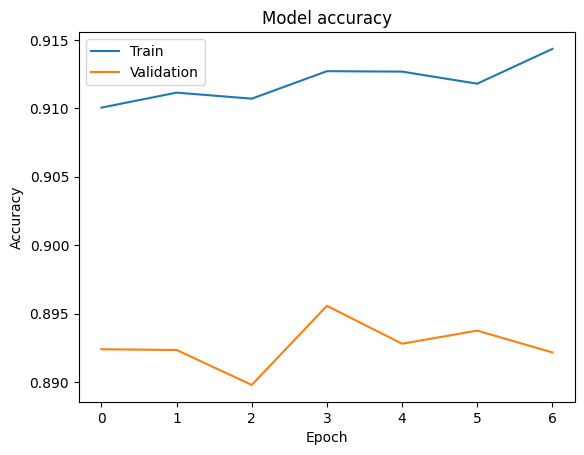

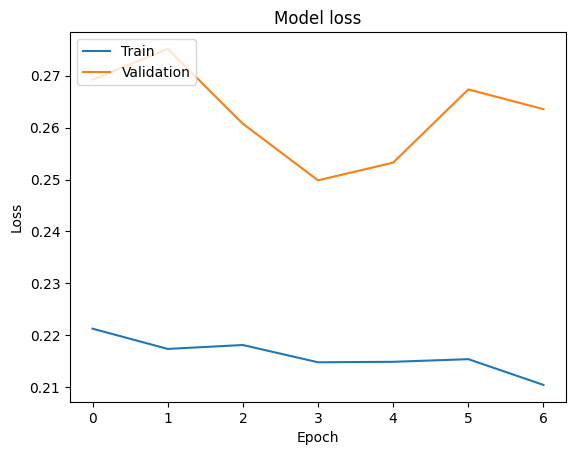

In [84]:
import matplotlib.pyplot as plt

def display_history(history):
    # Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

display_history(results)


7. Compute the predicted probabilities for the test images. Turn the probabilities into binary predictions using a threshold of 0.5. Display prediction statistics using the provided `display_statistics` utility for several test images.

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


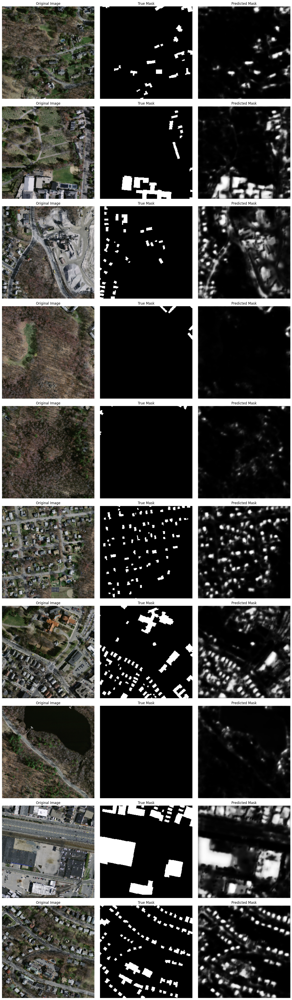

In [87]:
 
# Example usage:
# Predict using the model
predicted_probabilities = model.predict(testing_set)
predicted_labels = (predicted_probabilities > 0.5).astype(int)

def show_predictions(test_images, true_labels, predicted_labels, num_samples=10):
    plt.figure(figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Display the original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(test_images[i]/255)
        plt.title("Original Image")
        plt.axis('off')

        # Display true mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(true_labels[i].squeeze(), cmap='gray')
        plt.title("True Mask")
        plt.axis('off')

        # Display predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predicted_labels[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

show_predictions(testing_set, label_test_set, predicted_probabilities)


In [91]:
print("Testing set shape:", testing_set.shape)
print("Label Test set shape:", label_test_set.shape)
print("predicted_probabilities shape:", predicted_probabilities.shape)
print("Label Test set shape:", predicted_labels.shape)

Testing set shape: (50, 256, 256, 3)
Label Test set shape: (50, 256, 256, 1)
Label Test set shape: (50, 256, 256, 1)
Label Test set shape: (50, 256, 256, 1)


8. Assuming that we give equal importance to reducing false positives and false negatives, use a decision probability threshold that strikes the best balance between these two quantities.

In [79]:
predicted_labels[1].shape

(256, 256, 1)

9. **OPTIONAL** Modify the network with either batch-normalisation or spatial dropout layers to increase predictive performance. Alternatively, use image augmentation techniques to increase the robustness of the model.

In [141]:
import tensorflow as tf

# Define image dimensions and number of channels
im_width, im_height = 256, 256
im_channels = 3 

# Input layer
inputs = tf.keras.layers.Input((im_width, im_height, im_channels))

# Preprocessing layer to normalize input data
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

# Contracting Path
## First block
c1 = tf.keras.layers.Conv2D(8, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(8, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

## Second block
c2 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

## Third block
c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

## Fourth block
c4 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

## Fifth block (Bottleneck)
c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c5)

# Expansive Path
u6 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(16, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(8, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(8, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same')(c9)

outputs =  tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c9)

# Create and compile the model
 
# Define the learning rate
learning_rate = 0.005  # Example learning rate, adjust as needed

# Configure the Adam optimizer with the desired learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model with the specified optimizer
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]

results = model.fit(
    x=training_set,
    y=label_set,
    validation_data = (training_val_set, label_val_set),
    batch_size=32,
    callbacks=callbacks,
    epochs=50,
    verbose=1
)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 53s 4s/step - accuracy: 0.7444 - loss: 0.8413 - val_accuracy: 0.8676 - val_loss: 0.4249
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.8729 - loss: 0.3883 - val_accuracy: 0.8702 - val_loss: 0.3677
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - accuracy: 0.8791 - loss: 0.3357 - val_accuracy: 0.8716 - val_loss: 0.3250
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - accuracy: 0.8798 - loss: 0.3183 - val_accuracy: 0.8723 - val_loss: 0.3274
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - accuracy: 0.8866 - loss: 0.2996 - val_accuracy: 0.8790 - val_loss: 0.3127
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - accuracy: 0.8866 - loss: 0.2914 - val_accuracy: 0.8709 - val_loss: 0.3383
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - accuracy: 0.8893 - loss: 0.2910 - val_accuracy: 0.8807 - val_loss: 0.3073
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.8870 - loss: 0.2957 - val_accuracy: 0.8775 - val_loss: 0

# With Batch Normalization 

In [142]:
import tensorflow as tf

# Define image dimensions and number of channels
im_width, im_height = 256, 256
im_channels = 3 

# Input layer
inputs = tf.keras.layers.Input((im_width, im_height, im_channels))

# Preprocessing layer to normalize input data
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

# Contracting Path
## First block
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('selu')(c1)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer='he_normal', padding='same')(c1)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('selu')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

## Second block
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('selu')(c2)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer='he_normal', padding='same')(c2)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('selu')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

## Third block
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('selu')(c3)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer='he_normal', padding='same')(c3)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('selu')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

## Fourth block
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('selu')(c4)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer='he_normal', padding='same')(c4)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('selu')(c4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

## Fifth block (Bottleneck)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('selu')(c5)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer='he_normal', padding='same')(c5)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('selu')(c5)

# Expansive Path
u6 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('selu')(c6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer='he_normal', padding='same')(c6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('selu')(c6)

u7 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('selu')(c7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer='he_normal', padding='same')(c7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('selu')(c7)

u8 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('selu')(c8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer='he_normal', padding='same')(c8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('selu')(c8)

u9 = tf.keras.layers.Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('selu')(c9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer='he_normal', padding='same')(c9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('selu')(c9)

outputs =  tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c9)

# Create and compile the model

# Define the learning rate
learning_rate = 0.005  # Example learning rate, adjust as needed

# Configure the Adam optimizer with the desired learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model with the specified optimizer
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Setup callbacks for training
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]

# Model training
results = model.fit(
    x=training_set,
    y=label_set,
    validation_data = (training_val_set, label_val_set),
    batch_size=32,
    callbacks=callbacks,
    epochs=50,
    verbose=1
)


Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 56s 4s/step - accuracy: 0.5668 - loss: 0.7518 - val_accuracy: 0.4068 - val_loss: 51.6353
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.7564 - loss: 0.5535 - val_accuracy: 0.6385 - val_loss: 2.7241
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - accuracy: 0.8576 - loss: 0.4608 - val_accuracy: 0.7381 - val_loss: 3.0087
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.8813 - loss: 0.3960 - val_accuracy: 0.8630 - val_loss: 4.0248
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - accuracy: 0.9045 - loss: 0.3298 - val_accuracy: 0.7712 - val_loss: 1.8356
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - accuracy: 0.9076 - loss: 0.2899 - val_accuracy: 0.8556 - val_loss: 3.1490
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - accuracy: 0.9092 - loss: 0.2648 - val_accuracy: 0.4013 - val_loss: 2.4056
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - accuracy: 0.9077 - loss: 0.2537 - val_accuracy: 0.8276 - val_loss: 

# 

# Batch normalization + SELU + Variance Scaling 

In [143]:
import tensorflow as tf

# Define image dimensions and number of channels
im_width, im_height = 256, 256
im_channels = 3 

# Input layer
inputs = tf.keras.layers.Input((im_width, im_height, im_channels))

# Preprocessing layer to normalize input data
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

# Contracting Path
## First block
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(s)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('selu')(c1)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c1)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('selu')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

## Second block
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p1)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('selu')(c2)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c2)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('selu')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

## Third block
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p2)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('selu')(c3)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c3)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('selu')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

## Fourth block
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p3)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('selu')(c4)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c4)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('selu')(c4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

## Fifth block (Bottleneck)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p4)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('selu')(c5)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c5)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('selu')(c5)

# Expansive Path
u6 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('selu')(c6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('selu')(c6)

u7 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('selu')(c7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('selu')(c7)

u8 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('selu')(c8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('selu')(c8)

u9 = tf.keras.layers.Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('selu')(c9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('selu')(c9)

outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c9)

# Create and compile the model

# Define the learning rate
learning_rate = 0.005  # Example learning rate, adjust as needed

# Configure the Adam optimizer with the desired learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model with the specified optimizer
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Setup callbacks for training
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]

# Model training
results = model.fit(
    x=training_set,
    y=label_set,
    validation_data = (training_val_set, label_val_set),
    batch_size=32,
    callbacks=callbacks,
    epochs=50,
    verbose=1
)


Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step - accuracy: 0.5422 - loss: 0.8295 - val_accuracy: 0.6851 - val_loss: 20.2146
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - accuracy: 0.7174 - loss: 0.5793 - val_accuracy: 0.6868 - val_loss: 12.6784
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - accuracy: 0.8106 - loss: 0.4980 - val_accuracy: 0.6877 - val_loss: 8.9581
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - accuracy: 0.8699 - loss: 0.4312 - val_accuracy: 0.7900 - val_loss: 2.5195
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.8895 - loss: 0.3755 - val_accuracy: 0.8700 - val_loss: 1.4922
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.8969 - loss: 0.3322 - val_accuracy: 0.6468 - val_loss: 0.5960
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.9083 - loss: 0.2936 - val_accuracy: 0.8701 - val_loss: 0.7340
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - accuracy: 0.8995 - loss: 0.2844 - val_accuracy: 0.8702 - val_loss:

# Data Augmentation + SELU + Variance scaling + Batch Normalization

In [153]:
import tensorflow as tf

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2)),
    tf.keras.layers.RandomContrast(factor=0.1)
])
# Assuming the rest of the imports and model definitions are included as needed

# Define image dimensions and number of channels
im_width, im_height = 256, 256
im_channels = 3 

# Define the input layer
inputs = tf.keras.layers.Input((im_width, im_height, im_channels))

# Data augmentation
x = data_augmentation(inputs)

# Normalization layer
s = tf.keras.layers.Lambda(lambda x: x / 255)(x)

# Contracting Path
## First block
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(s)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('relu')(c1)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c1)
c1 = tf.keras.layers.BatchNormalization()(c1)
c1 = tf.keras.layers.Activation('relu')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

## Second block
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p1)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('relu')(c2)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c2)
c2 = tf.keras.layers.BatchNormalization()(c2)
c2 = tf.keras.layers.Activation('relu')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

## Third block
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p2)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('relu')(c3)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c3)
c3 = tf.keras.layers.BatchNormalization()(c3)
c3 = tf.keras.layers.Activation('relu')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

## Fourth block
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p3)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('relu')(c4)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c4)
c4 = tf.keras.layers.BatchNormalization()(c4)
c4 = tf.keras.layers.Activation('relu')(c4)
p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

## Fifth block (Bottleneck)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(p4)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('relu')(c5)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(128, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c5)
c5 = tf.keras.layers.BatchNormalization()(c5)
c5 = tf.keras.layers.Activation('relu')(c5)

# Expansive Path
u6 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('relu')(c6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(64, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c6)
c6 = tf.keras.layers.BatchNormalization()(c6)
c6 = tf.keras.layers.Activation('relu')(c6)

u7 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('relu')(c7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(32, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c7)
c7 = tf.keras.layers.BatchNormalization()(c7)
c7 = tf.keras.layers.Activation('relu')(c7)

u8 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('relu')(c8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(16, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c8)
c8 = tf.keras.layers.BatchNormalization()(c8)
c8 = tf.keras.layers.Activation('relu')(c8)

u9 = tf.keras.layers.Conv2DTranspose(8, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1])
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(u9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('relu')(c9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(8, (3, 3), kernel_initializer=tf.keras.initializers.VarianceScaling(), padding='same')(c9)
c9 = tf.keras.layers.BatchNormalization()(c9)
c9 = tf.keras.layers.Activation('relu')(c9)

outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c9)

# Create and compile the model

# Define the learning rate
learning_rate = 0.005  # Example learning rate, adjust as needed

# Configure the Adam optimizer with the desired learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

# Compile the model with the specified optimizer
model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# Setup callbacks for training
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=6),
    tf.keras.callbacks.TensorBoard(log_dir='logs')
]

# Model training
results = model.fit(
    x=training_set,
    y=label_set,
    validation_data = (training_val_set, label_val_set),
    batch_size=32,
    callbacks=callbacks,
    epochs=50,
    verbose=1
)

 

Epoch 1/50


2024-05-11 19:58:16.707746: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_38_1/dropout_135_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 398ms/step - accuracy: 0.2316 - loss: 0.9559 - val_accuracy: 0.3072 - val_loss: 1665.1061
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 280ms/step - accuracy: 0.7784 - loss: 0.6694 - val_accuracy: 0.3680 - val_loss: 5220.4395
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - accuracy: 0.8880 - loss: 0.5850 - val_accuracy: 0.8436 - val_loss: 128.6494
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - accuracy: 0.8852 - loss: 0.5324 - val_accuracy: 0.8646 - val_loss: 269.1755
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - accuracy: 0.8898 - loss: 0.4872 - val_accuracy: 0.8688 - val_loss: 45.3692
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 280ms/step - accuracy: 0.8824 - loss: 0.4578 - val_accuracy: 0.8690 - val_loss: 11.1626
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - accuracy: 0.8886 - loss: 0.4252 - val_accuracy: 0.8695 - val_loss: 1.8541
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - accuracy: 0.8834 - loss: 0.4082 - val_accuracy: 0.8701 - val_los

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


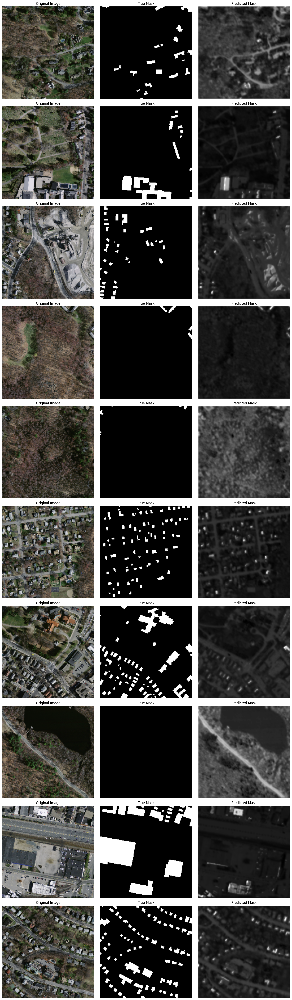

In [154]:

predicted_probabilities = model.predict(testing_set)
predicted_labels = (predicted_probabilities > 0.5).astype(int)

def show_predictions(test_images, true_labels, predicted_labels, num_samples=10):
    plt.figure(figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Display the original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(test_images[i]/255)
        plt.title("Original Image")
        plt.axis('off')

        # Display true mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(true_labels[i].squeeze(), cmap='gray')
        plt.title("True Mask")
        plt.axis('off')

        # Display predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(predicted_labels[i].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

show_predictions(testing_set, label_test_set, predicted_probabilities)
